In [1]:
import numpy as np
import zarr
from PIL import Image
from IPython.display import display
from tqdm.notebook import tqdm, trange

from gltfraytracer import Scene3D

In [2]:
# Retina plane
z_r = -17.0
size_r = 17.0

# Pupil plane
n_p = 2**5
size_p = 5.0
pitch_p = size_p / n_p
z_p = 0.0

# View Plane
n_v = 45 * 2**5
pitch_v = pitch_p
size_v = n_v * pitch_v
z_v = size_v - size_p

# Retina estimate
lf_pitch_r = pitch_v * (-z_r/ z_v)
lf_n_r = int(size_r / lf_pitch_r)

print('[Sampled Light Field]')
print('Pupil Plane:     {:4} / {:5.2f} = {:5} mm       z_p = {:5} mm'.format(n_p,       1/pitch_p, size_p, z_p))
print('View Plane:      {:4} / {:5.2f} = {:5} mm       z_v = {:5} mm'.format(n_v,       1/pitch_v, size_v, z_v))
print('Retina Estimate: {:4} / {:5.2f} = {:5} mm    z_near = {:5} mm'.format(lf_n_r, 1/lf_pitch_r, size_r, z_v/2))

ij_p = np.stack(np.broadcast_arrays(np.arange(n_p).reshape(n_p, 1), np.arange(n_p).reshape(1, n_p)), axis=-1).reshape(n_p**2, 2)
xyz_p = np.concatenate(((ij_p - (n_p - 1)/2) * pitch_p, -np.ones((n_p**2, 1)) * z_p), axis=-1)

ij_v = np.stack(np.broadcast_arrays(np.arange(n_v).reshape(n_v, 1), np.arange(n_v).reshape(1, n_v)), axis=-1).reshape(n_v**2, 2)
xyz_v = np.concatenate(((ij_v - (n_v - 1)/2) * pitch_v, -np.ones((n_v**2, 1)) * z_v), axis=-1)

print('\nNumber of rays:', f'{len(ij_p):,}', '×', f'{len(ij_v):,}', '=', f'{len(ij_p) * len(ij_v):,}')

[Sampled Light Field]
Pupil Plane:       32 /  6.40 =   5.0 mm       z_p =   0.0 mm
View Plane:      1440 /  6.40 = 225.0 mm       z_v = 220.0 mm
Retina Estimate: 1408 / 82.82 =  17.0 mm    z_near = 110.0 mm

Number of rays: 1,024 × 2,073,600 = 2,123,366,400


In [3]:
def array_stats(a):
    print('shape: ', a.shape, a.dtype, '| total size:', a.nbytes/2**30, 'GiB | range: [', np.amin(a), ',', np.amax(a), '] | average: ', np.average(a))


    
def display_image(values, absolute=False, normalize=False, flip=False):
    """Display an array as an image using a color map. The image can be normalized, shifted and/or flipped."""
    values = values.T
    values = np.abs(values) if absolute else values
    values = np.flip(values, axis=1) if flip else np.flip(values, axis=0)
    values = (values * np.nan_to_num(255.0 / np.amax(values))).astype(np.uint8) if normalize else np.clip(values * 255.0, 0.0, 255.0).astype(np.uint8)
    display(Image.fromarray(values))

    

def dot(a, b):
    return np.einsum('...i,...i', a, b)

Casting rays...


  0%|          | 0/1024 [00:00<?, ?it/s]

d:\light-field-prefiltering\gltfraytracer.py:307: RuntimeWarning: divide by zero encountered in true_divide
  visibility = np.nan_to_num(0.5 / (ggx_v + ggx_l))


Type,zarr.core.Array
Data type,float32
Shape,"(3, 32, 1440, 32, 1440)"
Chunk shape,"(3, 1, 1440, 1, 1440)"
Order,C
Read-only,False
Compressor,"Blosc(cname='lz4', clevel=5, shuffle=SHUFFLE, blocksize=0)"
Store type,zarr.storage.DirectoryStore
No. bytes,25480396800 (23.7G)
No. bytes stored,20903810716 (19.5G)
Storage ratio,1.2


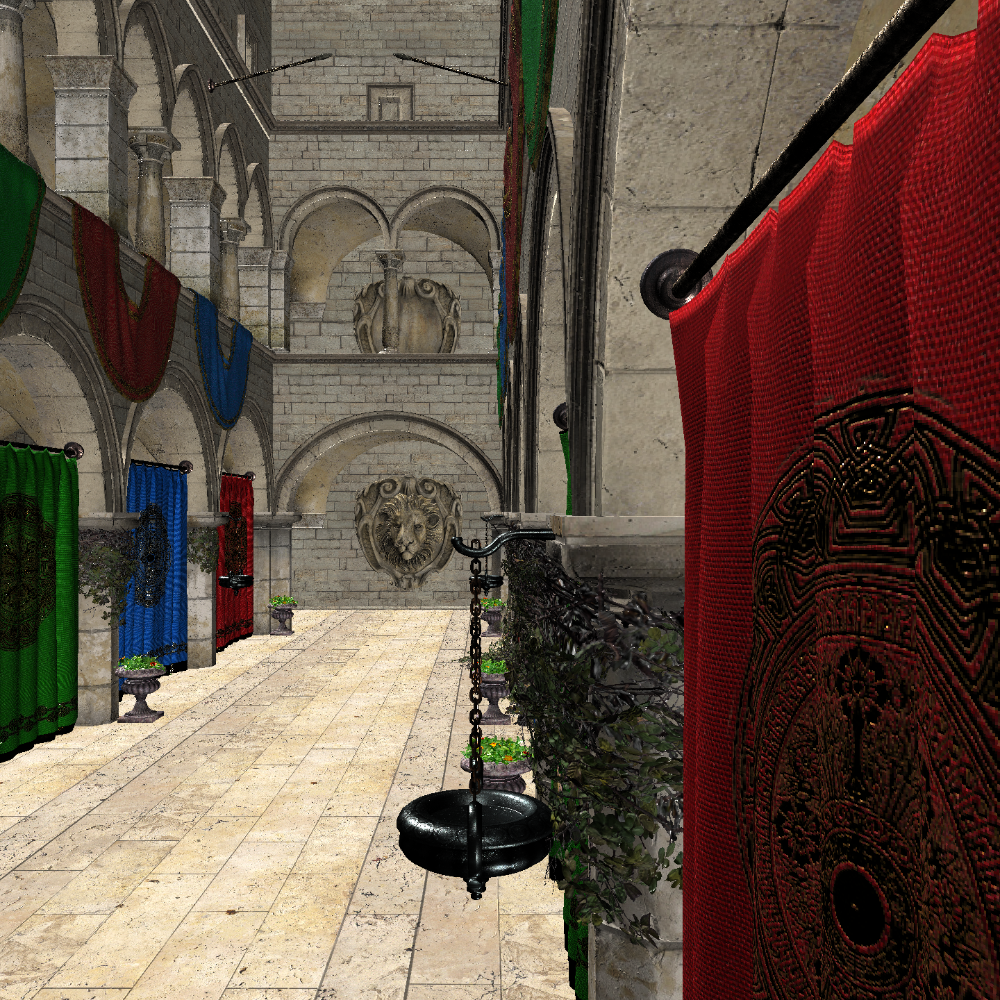

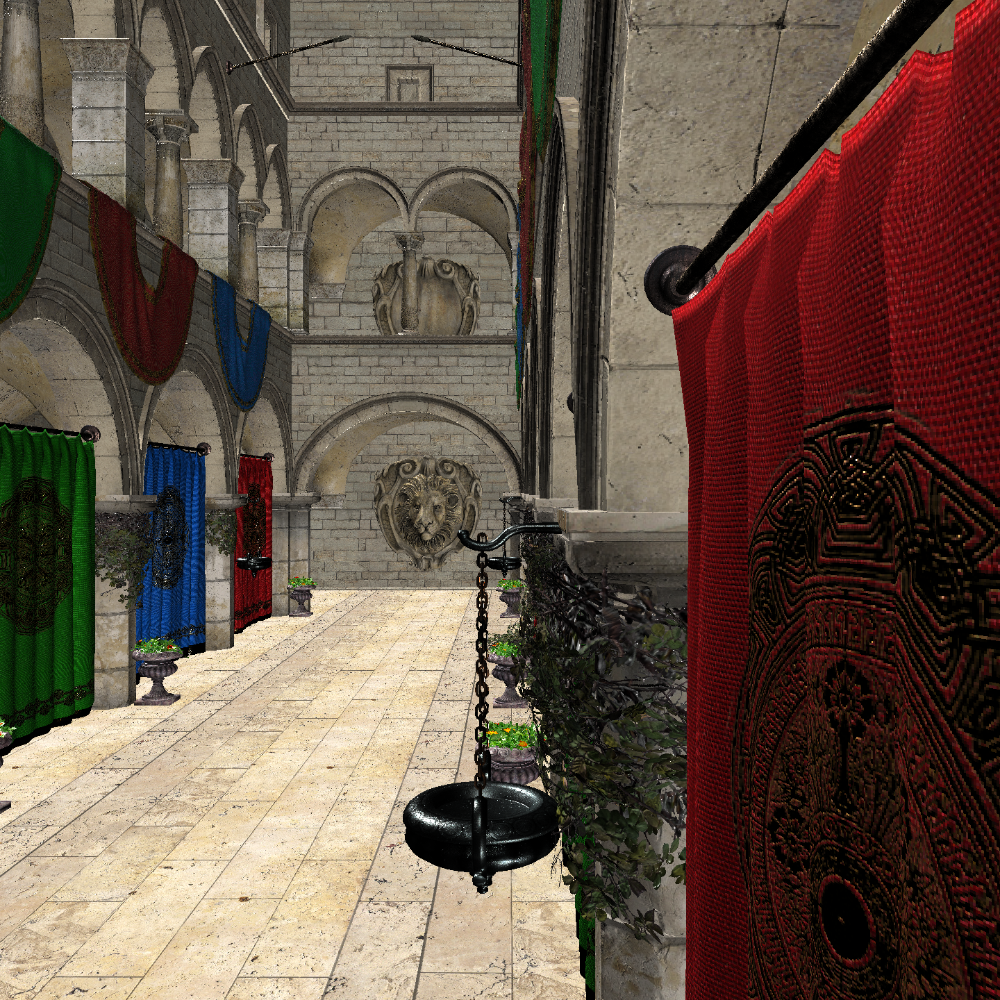

Wall time: 6h 9min 13s


In [5]:
%%time
print('Casting rays...')

light_field = zarr.open('data/sponza.zarr', mode='w', shape=(3, n_p, n_v, n_p, n_v), chunks=(3, 1, n_v, 1, n_v), dtype=np.float32)

light_values = np.array([[1.2, 1.2, 1.2], [0.8, 0.8, 0.8], [0.6, 0.6, 0.6]])
light_directions = np.array([[0.5, -0.7, 0.5], [-0.5, 0.7, -0.5], [0.0, -0.7, -0.7]])
light_directions /= np.sqrt(dot(light_directions, light_directions))[..., np.newaxis]

rotation = np.array([[0.0, 0.0, 1.0],
                     [0.0, 1.0, 0.0],
                     [1.0, 0.0, 0.0]])

translation = np.array([-150.0, -225.0, -800.0])

scene = Scene3D('../models/gltf/sponza/Sponza.gltf', rotation, translation)

for id_p in trange(len(ij_p)):
    ray_origins = np.tile(xyz_p[id_p], (len(xyz_v), 1))
    ray_directions = xyz_v - ray_origins
    ray_directions /= np.sqrt(dot(ray_directions, ray_directions))[..., np.newaxis]

    # Ray cast scene.
    ray_colors = np.moveaxis(scene.rayCast(ray_origins, ray_directions, light_values, light_directions), -1, 0).reshape(3, n_v, n_v).astype(np.float32)

    # Clip ray values in [0, 1].
    ray_colors = np.clip(ray_colors, 0.0, 1.0)

    # Store ray values.
    light_field[:, ij_p[id_p, 0], :, ij_p[id_p, 1], :] = ray_colors

scene.release()

display(light_field.info)

display_image(light_field[:,  0, :,  0, :])
display_image(light_field[:, -1, :, -1, :])